In [1]:
import numpy as np
import sympy as sym
from sympy import symbols, Eq, pprint, init_printing
import scipy.integrate
import matplotlib.pyplot as plt
import tellurium as te
import pandas as pd
from IPython.display import display
from publish_format import *
sym.init_printing()

/Users/xcyan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning:

Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).



#### Fit Cohesive network rates [PDS5, Wapl, Sororin, Nipbl, unloading]

In [2]:
## Rates for cohesive network 
rates_coh = sym.symbols("K_RacP_RacPW, K_RacPW_RacP, K_RacP_RacPS, K_RacPS_RacP, K_RacP_Rac, K_Rac_RacP, K_Rac_RacN, K_RacN_Rac, K_RacPW_Rac_free")
K_RacP_RacPW, K_RacPW_RacP, K_RacP_RacPS, K_RacPS_RacP, K_RacP_Rac, K_Rac_RacP, K_Rac_RacN, K_RacN_Rac, K_RacPW_Rac_free = rates_coh

paras_coh = sym.symbols("tau_S, F_S, N_S, tau_W, F_W, N_W, tau_P, F_P, N_P, tau_N, F_N, N_N, tau_R, F_R_sister, N_R")
tau_S, F_S, N_S, tau_W, F_W, N_W, tau_P, F_P, N_P, tau_N, F_N, N_N, tau_R, F_R_sister, N_R = paras_coh 

## Equations for cohesive network
rhs_coh = [K_RacPW_Rac_free * N_W * F_W - F_R_sister*N_R/tau_R,                              # RAD21 unbinding  
           F_N/(tau_N * (1-F_N)) - K_Rac_RacN * (F_R_sister * N_R - F_P * N_P - F_N * N_N),  # Nipbl binding
           K_RacN_Rac - 1/tau_N,                                                             # Nipbl unbinding 
           F_W/(tau_W * (1-F_W)) - K_RacP_RacPW * (F_P * N_P - F_S * N_S - F_W * N_W),       # Wapl binding 
           K_RacPW_RacP + K_RacPW_Rac_free - 1/tau_W,                                        # Wapl unbinding  
           F_S/(tau_S * (1-F_S)) - K_RacP_RacPS * (F_P * N_P - F_S * N_S - F_W * N_W),       # Sororin binding
           K_RacPS_RacP - 1/tau_S,                                                           # Sororin unbinding
           F_P/(tau_P * (1-F_P)) - K_Rac_RacP * (F_R_sister * N_R - F_P * N_P - F_N * N_N),                  # PDS5 binding
           K_RacPW_Rac_free * F_W *N_W + K_RacP_Rac*(F_P * N_P - F_S * N_S - F_W * N_W) - F_P * N_P/tau_P,   # PDS5 unbinding  
]

## solutions cohesive network
sol_rates_coh = sym.solve(rhs_coh, rates_coh)

for i, eq in enumerate(rhs_coh, 1):
    pprint(Eq(symbols(f"eq_{i}"), eq))

        F_R_sister⋅N_R                           
eq₁ = - ────────────── + F_W⋅K_RacPW_Rac_free⋅N_W
             τ_R                                 
           F_N                                                        
eq₂ = ───────────── - K_Rac_RacN⋅(-F_N⋅N_N - F_P⋅N_P + F_R_sister⋅N_R)
      τ_N⋅(1 - F_N)                                                   
                    1 
eq₃ = K_RacN_Rac - ───
                   τ_N
           F_W                                                  
eq₄ = ───────────── - K_RacP_RacPW⋅(F_P⋅N_P - F_S⋅N_S - F_W⋅N_W)
      τ_W⋅(1 - F_W)                                             
                                         1 
eq₅ = K_RacPW_RacP + K_RacPW_Rac_free - ───
                                        τ_W
           F_S                                                  
eq₆ = ───────────── - K_RacP_RacPS⋅(F_P⋅N_P - F_S⋅N_S - F_W⋅N_W)
      τ_S⋅(1 - F_S)                                             
                      1 
eq₇ = K_RacPS_RacP - 

In [3]:
## parameters for cohesive network
# Define the input parameters
x = 0.1306   # for W
y = 0.3067  # for P  
z = 0.1536  # for N

paras_values_coh = [
    100.,                  # tau_S
    0.52,                  # F_S
    79770,                 # N_S
    45.,                   # tau_W
    x/(0.65 + x),          # modified F_W for sister 
    69542*(0.65 + x),      # modified N_W for sister
    72,                    # tau_P
    y/(0.58 + y),          # modified F_P for sister
    180615*(0.58 + y),     # modified N_P for sister
    72.,                   # tau_N
    z/(0.6 + z),           # modified F_N for sister
    119308*(0.6 + z),      # modified N_N for sister
    3600 * 10,             # tau_R_sister, 6h 
    1/2,                   # modified F_R_sister
    284470*2/3,            # modified N_R
]

paras_dict_coh = dict(zip(paras_coh, paras_values_coh))

for s in sol_rates_coh.items():
    rate = s[1].evalf(subs=paras_dict_coh)
    paras_dict_coh[s[0]] = rate

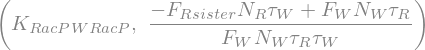

0.0219322059515254


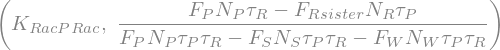

0.158677596516148


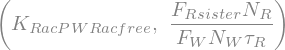

0.000290016270696779


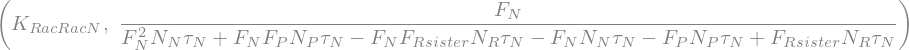

1.68485754442323e-7


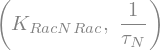

0.0138888888888889


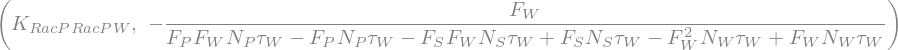

9.24032418587105e-7


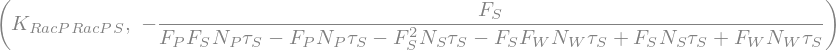

2.24198141378093e-6


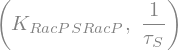

0.0100000000000000


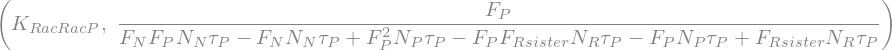

3.48023847571798e-7


In [4]:
## print the rates for the cohesive network
paras_dict_coh = dict(zip(paras_coh, paras_values_coh))
for s in sol_rates_coh.items():
    rate = s[1].evalf(subs=paras_dict_coh)
    paras_dict_coh[s[0]] = rate
    display(s)
    print(rate)

#### Extrusive network [Nipbl, PDS5, Wapl, unloading]

##### assume RPW cobound state, not RW state

In [5]:
## Rates for extrusive network
rates_ext = sym.symbols("Kext_R_free_RN, Kext_RN_R, Kext_R_RN, Kext_R_RP, Kext_RP_R, Kext_RP_RPW, Kext_RPW_RP, Kext_RPW_R_free")
Kext_R_free_RN, Kext_RN_R, Kext_R_RN, Kext_R_RP, Kext_RP_R, Kext_RP_RPW, Kext_RPW_RP, Kext_RPW_R_free = rates_ext

paras_ext = sym.symbols("tau_N_ext, F_N_ext, N_N_ext, tau_W_ext, F_W_ext, N_W_ext, tau_P_ext, F_P_ext, N_P_ext, tau_R_ext, F_R_ext, N_R_ext")
tau_N_ext, F_N_ext, N_N_ext, tau_W_ext, F_W_ext, N_W_ext, tau_P_ext, F_P_ext, N_P_ext, tau_R_ext, F_R_ext, N_R_ext = paras_ext

## Equations for extrusive network
rhs_ext = [ Kext_RN_R - 1 / tau_N_ext,  # NIPBL unbinding kinetics
        Kext_R_free_RN * N_R_ext *(1-F_R_ext) + Kext_R_RN * (N_R_ext*F_R_ext - N_N_ext*F_N_ext - N_P_ext*F_P_ext) -  F_N_ext / tau_N_ext/ (1-F_N_ext), # NIPBL binding equilibrium
        Kext_RP_R * (N_P_ext * F_P_ext - N_W_ext * F_W_ext) + Kext_RPW_R_free * N_W_ext * F_W_ext  - N_P_ext * F_P_ext/tau_P_ext, # PDS5 unbinding kinetics
        Kext_R_RP * (N_R_ext * F_R_ext - N_N_ext * F_N_ext - N_P_ext * F_P_ext)  - F_P_ext / tau_P_ext /(1-F_P_ext), # PDS5 binding equilibrium,
        Kext_RPW_RP + Kext_RPW_R_free - 1 / tau_W_ext, # WAPL unbinding kinetics
        Kext_RP_RPW * (N_P_ext * F_P_ext - N_W_ext* F_W_ext)  - F_W_ext / tau_W_ext / (1-F_W_ext), # WAPL binding equilibrium
        Kext_RPW_R_free * N_W_ext * F_W_ext - F_R_ext * N_R_ext / tau_R_ext,  # RAD21 unbinding kinetics
        Kext_R_free_RN * N_N_ext * (1-F_N_ext) - F_R_ext / tau_R_ext / (1-F_R_ext) # RAD21 binding equilibrium, 
]

sol_rates_ext = sym.solve(rhs_ext, rates_ext)
# Print equations
for i, eq in enumerate(rhs_ext, 1):
    pprint(Eq(symbols(f"eq_{i}"), eq))

                     1   
eq₁ = Kext_RN_R - ───────
                  τ_N_ext
               F_N_ext                                                        
eq₂ = - ───────────────────── + Kext_R_RN⋅(-F_N_ext⋅N_N_ext - F_P_ext⋅N_P_ext 
        τ_N_ext⋅(1 - F_N_ext)                                                 

                                                         
+ F_R_ext⋅N_R_ext) + Kext_R_free_RN⋅N_R_ext⋅(1 - F_R_ext)
                                                         
        F_P_ext⋅N_P_ext                                                       
eq₃ = - ─────────────── + F_W_ext⋅Kext_RPW_R_free⋅N_W_ext + Kext_RP_R⋅(F_P_ext
            τ_P_ext                                                           

                           
⋅N_P_ext - F_W_ext⋅N_W_ext)
                           
               F_P_ext                                                        
eq₄ = - ───────────────────── + Kext_R_RP⋅(-F_N_ext⋅N_N_ext - F_P_ext⋅N_P_ext 
        τ_P_ext⋅(1 - F_P_ext) 

In [6]:
paras_values_ext = [
    72.,                          # tau_N
    (0.4 - z)/(1 - z),            # F_N
    119308*(1 - z),               # N_N
    45.,                          # tau_W
    (0.35 - x)/(1 - x),           # modified F_W for extrusive
    69542*(1 - x),                # modified N_W for extrusive
    72,                           # tau_P
    (0.42 - y)/(1 - y),           # modified F_P for extrusive
    180615*(1 - y),               # modified N_P for extrusive
    822.,                         # tau_R_extrusive
    1/2,                          # modified F_R_sister
    284470*2/3,                   # modified N_R
]

paras_dict_ext = dict(zip(paras_ext, paras_values_ext))

for s in sol_rates_ext.items():
    rate = s[1].evalf(subs=paras_dict_ext)
    paras_dict_ext[s[0]] = rate

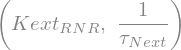

0.0138888888888889


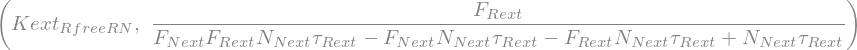

1.69944598876500e-8


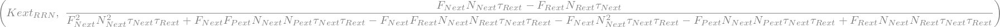

9.10150252853556e-8


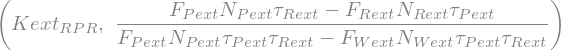

0.0324348013096406


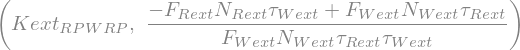

0.0146615640996053


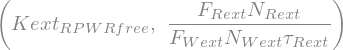

0.00756065812261696


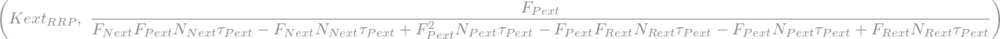

6.03423511339860e-8


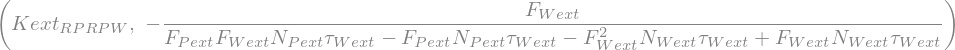

1.44076400442243e-6


In [7]:
### print the rates for the extrusive network
paras_dict_ext = dict(zip(paras_ext, paras_values_ext))
for s in sol_rates_ext.items():
    rate = s[1].evalf(subs=paras_dict_ext)
    paras_dict_ext[s[0]] = rate
    display(s)
    print(rate)

#### The combined networks

In [8]:
## models for combined cohesive and extrusive networks
model_ext_coh ='''
    # Define species and parameters
    
    # Cohesive network 
    Rac + N -> RacN; K_Rac_RacN*Rac*N - K_RacN_Rac*RacN
    Rac + P -> RacP; K_Rac_RacP*Rac*P - K_RacP_Rac*RacP
    RacP + S -> RacPS; K_RacP_RacPS*RacP*S - K_RacPS_RacP*RacPS
    RacP + W -> RacPW; K_RacP_RacPW*RacP*W - K_RacPW_RacP*RacPW
    RacPW -> Rac_free + P + W; K_RacPW_Rac_free*RacPW 
    
    # Extrusive network 
    R_free + N -> RN; Kext_R_free_RN*R_free*N 
    RN  -> R + N; Kext_RN_R*RN - Kext_R_RN*R*N
    R + P -> RP; Kext_R_RP*R*P - Kext_RP_R*RP
    RP + W -> RPW; Kext_RP_RPW*RP*W - Kext_RPW_RP*RPW 
    RPW -> R_free + P + W; Kext_RPW_R_free*RPW
    
    # deacetylation
    # Rac_free -> R_free; K_Rac_free_R_free*Rac_free
    
    # Rates for cohesive network,  9 rates
    K_Rac_RacN = {K_Rac_RacN};
    K_RacN_Rac = {K_RacN_Rac};
    K_Rac_RacP = {K_Rac_RacP}; 
    K_RacP_Rac = {K_RacP_Rac}; 
    K_RacP_RacPS = {K_RacP_RacPS}; 
    K_RacPS_RacP = {K_RacPS_RacP}; 
    K_RacP_RacPW = {K_RacP_RacPW}; 
    K_RacPW_RacP = {K_RacPW_RacP};  
    K_RacPW_Rac_free = {K_RacPW_Rac_free}; 

    # Rates for extrusive network, 8 rates
    Kext_R_free_RN = {Kext_R_free_RN};
    Kext_RN_R = {Kext_RN_R};
    Kext_R_RN = {Kext_R_RN};
    Kext_R_RP = {Kext_R_RP};
    Kext_RP_R = {Kext_RP_R};
    Kext_RP_RPW = {Kext_RP_RPW};
    Kext_RPW_RP = {Kext_RPW_RP};
    Kext_RPW_R_free = {Kext_RPW_R_free};

    # K_Rac_free_R_free = {K_Rac_free_R_free}; 
    
    # Initial conditions
    Rac_free = {Rac_free_init}; 
    Rac = {Rac_init}; 
    RacP = {RacP_init}; 
    RacN = {RacN_init}; 
    RacPW = {RacPW_init}; 
    RacPS = {RacPS_init}; 

    R_free = {R_free_init};
    RN = {RN_init};
    R = {R_init};
    RP = {RP_init};
    RPW = {RPW_init};
    
    N = {N_init};
    S = {S_init}; 
    W = {W_init}; 
    P = {P_init};
'''

def build_model_ext_coh(model, parameter_dict):
    string_params = {str(k): v for k, v in parameter_dict.items()}
    return model.format(**string_params)


In [9]:
# Define symbolic initial conditions
Rac_free_init, Rac_init, RacN_init, RacP_init, RacPW_init, RacPS_init, R_free_init, RN_init, R_init, RP_init, RPW_init, N_init, S_init, W_init, P_init = sym.symbols(
    "Rac_free_init, Rac_init, RacN_init, RacP_init, RacPW_init, RacPS_init, R_free_init, RN_init, R_init, RP_init, RPW_init, N_init, S_init, W_init, P_init")

In [10]:
paras_dict_coh

In [12]:
init_conditions_ext_coh = {
    Rac_free_init: 0, 
    Rac_init: paras_dict_coh[N_R]*1/2, 
    RacN_init: 0, 
    RacP_init: 0,
    RacPW_init: 0,
    RacPS_init: 0,

    R_free_init: paras_dict_coh[N_R],
    RN_init: 0,
    R_init: 0,
    RP_init: 0, 
    RPW_init: 0, 
    
    N_init: 119308,
    S_init: paras_dict_coh[N_S],
    W_init: 69542,
    P_init: 180615,
}

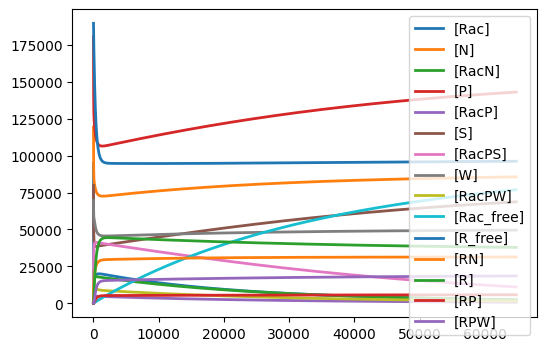

In [13]:
paras_dict = paras_dict_coh | paras_dict_ext | init_conditions_ext_coh | {"K_Rac_free_R_free": 1/2495}
paras_dict_ext_coh = {str(key): value for key, value in paras_dict.items()}
Model_ext_coh = build_model_ext_coh(model_ext_coh, paras_dict_ext_coh)
# print(model_ext_coh)
# Load the modes
r_ext_coh = te.loada(Model_ext_coh)
# Simulate the model
Model_ext_coh_WT = r_ext_coh.simulate(0, 3600*18, 3600*18)
# Plot the simulation results
r_ext_coh.plot()

In [15]:
columns = ['time', 'Rac', 'N', 'RacN', 'P', 'RacP', 'S', 'RacPS', 'W', 'RacPW', 
           'Rac_free', 'R_free', 'RN', 'R', 'RP', 'RPW']
df_WT = pd.DataFrame(Model_ext_coh_WT, columns=columns)

for h in range(19):  # 0h to 18h 
    index = 3600 * h - 1  if h > 0 else 0
    # calculate the ratio of bouned sisterC / total initial sisterC
    bound_sisterC_ratio = (df_WT['Rac'][index] + df_WT['RacN'][index] + df_WT['RacP'][index] + df_WT['RacPW'][index] + df_WT['RacPS'][index]) / (paras_dict_coh[N_R]*0.5)
    bound_sisterC_ratio_f = "{:.4f}".format(bound_sisterC_ratio)
    sisterC_value = int(7765 * bound_sisterC_ratio)
    if index > 0: 
        bound_extC_ratio = (df_WT['R'][index] + df_WT['RN'][index] + df_WT['RP'][index] + df_WT['RPW'][index]) / (paras_dict_coh[N_R]*0.5)
        bound_extC_ratio_f = "{:.4f}".format(bound_extC_ratio)
        extC_bound_frac = (df_WT['R'][index] + df_WT['RN'][index] + df_WT['RP'][index] + df_WT['RPW'][index])/((df_WT['R'][index] + df_WT['RN'][index] + df_WT['RP'][index] + df_WT['RPW'][index]) + df_WT['R_free'][index])
        extC_value = int(7765 * bound_extC_ratio)
        velocity = 1/5*(df_WT['R'][index] + df_WT['RN'][index] + df_WT['RP'][index] + df_WT['RPW'][index])/df_WT['RN'][index]
    else:
        bound_extC_ratio = 1
        bound_extC_ratio_f = "{:.4f}".format(bound_extC_ratio)
        extC_bound_frac = 1/2
        extC_value = int(7765 * bound_extC_ratio)
        velocity = 'NAN'
    LEF = 320000*extC_bound_frac/(extC_value/2)
    # print(f"{h}h -- {sisterC_value} -- {bound_sisterC_ratio_f}")
    if index == 0:
        print("h -- sisterC_value -- bound_sisterC_ratio_f -- extC_value -- bound_extC_ratio_f -- extC_bound_frac -- LEF -- velocity -- RacPS")
    print(f"{h}h -- {sisterC_value} -- {bound_sisterC_ratio_f} -- {extC_value} -- {bound_extC_ratio_f} -- {extC_bound_frac} -- {LEF} -- {velocity} -- {df_WT['RacPS'][index]}")

h -- sisterC_value -- bound_sisterC_ratio_f -- extC_value -- bound_extC_ratio_f -- extC_bound_frac -- LEF -- velocity -- RacPS
0h -- 7764 -- 1.0000 -- 7765 -- 1.0000 -- 0.5 -- 41.210560206052804 -- NAN -- 0.0
1h -- 7008 -- 0.9026 -- 7774 -- 1.0012 -- 0.5006113081938401 -- 41.213176903017455 -- 0.6373290130402828 -- 39055.629832036255
2h -- 6348 -- 0.8176 -- 7778 -- 1.0017 -- 0.5008712050027117 -- 41.2133673440133 -- 0.6308820905172953 -- 36703.06317896559
3h -- 5756 -- 0.7413 -- 7778 -- 1.0017 -- 0.5008473910467399 -- 41.21140785162169 -- 0.6254430164438958 -- 34399.81435849967
4h -- 5223 -- 0.6728 -- 7774 -- 1.0012 -- 0.5006137593791689 -- 41.21337869856805 -- 0.6208533615038554 -- 32164.37157061408
5h -- 4745 -- 0.6111 -- 7768 -- 1.0004 -- 0.500224728020614 -- 41.21315987811444 -- 0.6169728317487049 -- 30011.40274643187
6h -- 4315 -- 0.5557 -- 7760 -- 0.9995 -- 0.4997254684947452 -- 41.21447162843259 -- 0.613683447677141 -- 27951.80626476016
7h -- 3927 -- 0.5058 -- 7751 -- 0.9983 -- 

In [16]:
time_18h = 3600*9 -1
print("dS 18h (quick equilibrium)")
print(f"R_free to RN: {paras_dict_ext_coh['Kext_R_free_RN']*df_WT['N'][time_18h]}")
print(f"RPW to R_free: {paras_dict_ext_coh['Kext_RPW_R_free']}")
print(f"RN to R: {paras_dict_ext_coh['Kext_RN_R']}")
print(f"R to RN: {paras_dict_ext_coh['Kext_R_RN']*df_WT['N'][time_18h]}")
print(f"R to RP: {paras_dict_ext_coh['Kext_R_RP']*df_WT['P'][time_18h]}")
print(f"RP to R: {paras_dict_ext_coh['Kext_RP_R']}")
print(f"RP to RPW: {paras_dict_ext_coh['Kext_RP_RPW']*df_WT['W'][time_18h]}")
print(f"RPW to RP: {paras_dict_ext_coh['Kext_RPW_RP']}")

dS 18h (quick equilibrium)
R_free to RN: 0.00139476438889403
RPW to R_free: 0.00756065812261696
RN to R: 0.0138888888888889
R to RN: 0.00746975878971917
R to RP: 0.00783344725087012
RP to R: 0.0324348013096406
RP to RPW: 0.0698280370859858
RPW to RP: 0.0146615640996053


In [18]:
time_0h = 0
print("WT 0h")
print(f"R_free to RN: {paras_dict_ext_coh['Kext_R_free_RN']*df_WT['N'][time_0h]}")
print(f"RPW to R_free: {paras_dict_ext_coh['Kext_RPW_R_free']}")
print(f"RN to R: {paras_dict_ext_coh['Kext_RN_R']}")
print(f"R to RN: {paras_dict_ext_coh['Kext_R_RN']*df_WT['N'][time_0h]}")
print(f"R to RP: {paras_dict_ext_coh['Kext_R_RP']*df_WT['P'][time_0h]}")
print(f"RP to R: {paras_dict_ext_coh['Kext_RP_R']}")
print(f"RP to RPW: {paras_dict_ext_coh['Kext_RP_RPW']*df_WT['W'][time_0h]}")
print(f"RPW to RP: {paras_dict_ext_coh['Kext_RPW_RP']}")

WT 0h
R_free to RN: 0.00202757502027575
RPW to R_free: 0.00756065812261696
RN to R: 0.0138888888888889
R to RN: 0.0108588206367452
R to RP: 0.0108987337500649
RP to R: 0.0324348013096406
RP to RPW: 0.100193610395545
RPW to RP: 0.0146615640996053


In [19]:
time_9h = 3600*9 - 1
print("WT 9h")
print(f"R_free to RN: {paras_dict_ext_coh['Kext_R_free_RN']*df_WT['N'][time_9h]}")
print(f"RPW to R_free: {paras_dict_ext_coh['Kext_RPW_R_free']}")
print(f"RN to R: {paras_dict_ext_coh['Kext_RN_R']}")
print(f"R to RN: {paras_dict_ext_coh['Kext_R_RN']*df_WT['N'][time_9h]}")
print(f"R to RP: {paras_dict_ext_coh['Kext_R_RP']*df_WT['P'][time_9h]}")
print(f"RP to R: {paras_dict_ext_coh['Kext_RP_R']}")
print(f"RP to RPW: {paras_dict_ext_coh['Kext_RP_RPW']*df_WT['W'][time_9h]}")
print(f"RPW to RP: {paras_dict_ext_coh['Kext_RPW_RP']}")

WT 9h
R_free to RN: 0.00139476438889403
RPW to R_free: 0.00756065812261696
RN to R: 0.0138888888888889
R to RN: 0.00746975878971917
R to RP: 0.00783344725087012
RP to R: 0.0324348013096406
RP to RPW: 0.0698280370859858
RPW to RP: 0.0146615640996053


In [20]:
time_9h = 3600*1 - 1
print("WT 9h")
print(f"R_free to RN: {paras_dict_ext_coh['Kext_R_free_RN']*df_WT['N'][time_9h]}")
print(f"RPW to R_free: {paras_dict_ext_coh['Kext_RPW_R_free']}")
print(f"RN to R: {paras_dict_ext_coh['Kext_RN_R']}")
print(f"R to RN: {paras_dict_ext_coh['Kext_R_RN']*df_WT['N'][time_9h]}")
print(f"R to RP: {paras_dict_ext_coh['Kext_R_RP']*df_WT['P'][time_9h]}")
print(f"RP to R: {paras_dict_ext_coh['Kext_RP_R']}")
print(f"RP to RPW: {paras_dict_ext_coh['Kext_RP_RPW']*df_WT['W'][time_9h]}")
print(f"RPW to RP: {paras_dict_ext_coh['Kext_RPW_RP']}")

WT 9h
R_free to RN: 0.00124773536370261
RPW to R_free: 0.00756065812261696
RN to R: 0.0138888888888889
R to RN: 0.00668233450357266
R to RP: 0.00653231686127759
RP to R: 0.0324348013096406
RP to RPW: 0.0659509212310290
RPW to RP: 0.0146615640996053


#### Sister RAD21 residence time

In [21]:
def sister_RAD21_bound_time(K_RacPW_Rac_free, B_W_sister, B_R_sister):
    # K_RPW_R_free * N_W * F_W - F_R_sister*N_R/tau_R
    ### F_R is the fraction of bounded RAD21, T_W is the total number of bounded Wapl 
    return B_R_sister/(K_RacPW_Rac_free * B_W_sister)


time_6h = 3600*10 - 1

sister_RAD21_time_6h = sister_RAD21_bound_time(
        K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = df_WT['RacPW'][time_6h], \
        B_R_sister = df_WT['RacPS'][time_6h] \
            + df_WT['RacPW'][time_6h] \
            + df_WT['RacP'][time_6h] \
            + df_WT['Rac'][time_6h]  \
            + df_WT['RacN'][time_6h] )

sister_RAD21_time_18h = sister_RAD21_bound_time(
        K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = df_WT['RacPW'][time_18h], \
        B_R_sister = df_WT['RacPS'][time_18h] \
            + df_WT['RacPW'][time_18h] \
            + df_WT['RacP'][time_18h] \
            + df_WT['Rac'][time_18h]  \
            + df_WT['RacN'][time_18h] )

sister_RAD21_time_18h = sister_RAD21_bound_time(
        K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = r_ext_coh.RacPW_conc, \
        B_R_sister = r_ext_coh.RacPS_conc \
            + r_ext_coh.RacPW_conc \
            + r_ext_coh.RacP_conc 
            + r_ext_coh.Rac_conc \
            + r_ext_coh.RacN_conc)

print(sister_RAD21_time_6h, sister_RAD21_time_18h, sister_RAD21_time_18h)

39548.5666977534 41805.7464430178 41805.7464430178


In [22]:
def extrusive_RAD21_bound_time(Kext_RPW_R_free, B_W_ext, B_R_ext):
    # Kext_RPW_R_free * N_W_ext * F_W_ext - F_R_ext * N_R_ext / tau_R_ext,  # RAD21 unbinding kinetics
    ### F_R is the fraction of bounded RAD21, T_W is the total number of bounded Wapl 
    return B_R_ext/(Kext_RPW_R_free * B_W_ext)

extrusive_RAD21_bound_time(Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'], \
        B_W_ext = r_ext_coh.RPW_conc, \
        B_R_ext = + r_ext_coh.R_conc + r_ext_coh.RN_conc + r_ext_coh.RP_conc + r_ext_coh.RPW_conc)

### the extrusive cohesin statistics residence time

In [23]:
for h in range(1, 19):  # 1h to 18h inclusive
    index = 3600 * h - 1 if h > 0 else 0

    bounded_ext_R = df_WT['R'][index] + df_WT['RP'][index] + df_WT['RN'][index] + df_WT['RPW'][index]

    extrusive_lifetime = extrusive_RAD21_bound_time(
        Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'], \
        B_W_ext = df_WT['RPW'][index], \
        B_R_ext = bounded_ext_R)
    
    ## bounded fraction only divide by the R_free, not Rac_free at the time 
    bound_fraction = (bounded_ext_R)/(bounded_ext_R + df_WT['R_free'][index])
    ## RN/Total bounded R 
    processity_ratio = df_WT['RN'][index]/bounded_ext_R
    print(f"{h}h -- {bounded_ext_R} -- {extrusive_lifetime} -- {bound_fraction} -- {processity_ratio}")

1h -- 94939.26589458581 -- 803.600829781024 -- 0.5006113081938403 -- 0.31380965860306576
2h -- 94988.5544580656 -- 787.177825032853 -- 0.5008712050027117 -- 0.3170164488835131
3h -- 94984.03822069542 -- 772.432068059383 -- 0.5008473910467399 -- 0.31977333624595783
4h -- 94939.73075371279 -- 759.196787976456 -- 0.5006137593791689 -- 0.32213725881350175
5h -- 94865.95225333408 -- 747.319932649703 -- 0.5002247280206139 -- 0.324163382418532
6h -- 94771.26934845149 -- 736.661367648123 -- 0.4997254684947452 -- 0.3259009196956866
7h -- 94662.6021842874 -- 727.092785733628 -- 0.4991524704765143 -- 0.3273929747196203
8h -- 94545.45243443814 -- 718.498005986004 -- 0.4985347440913983 -- 0.32867675263260004
9h -- 94424.02921498514 -- 710.771872303743 -- 0.4978944838559447 -- 0.3297839098789601
10h -- 94301.53965502534 -- 703.820091553452 -- 0.49724860084564576 -- 0.3307415068736006
11h -- 94180.33662218956 -- 697.558475421889 -- 0.4966095016462444 -- 0.3315721271321451
12h -- 94062.11874096 -- 691

1h -- 803.600829781024 -- 0.5006113081938403 -- 0.31380965860306576
2h -- 787.177825032853 -- 0.5008712050027117 -- 0.3170164488835131
3h -- 772.432068059383 -- 0.5008473910467399 -- 0.31977333624595783
4h -- 759.196787976456 -- 0.5006137593791689 -- 0.32213725881350175
5h -- 747.319932649703 -- 0.5002247280206139 -- 0.324163382418532
6h -- 736.661367648123 -- 0.4997254684947452 -- 0.3259009196956866
7h -- 727.092785733628 -- 0.4991524704765143 -- 0.3273929747196203
8h -- 718.498005986004 -- 0.4985347440913983 -- 0.32867675263260004
9h -- 710.771872303743 -- 0.4978944838559447 -- 0.3297839098789601
10h -- 703.820091553452 -- 0.49724860084564576 -- 0.3307415068736006
11h -- 697.558475421889 -- 0.4966095016462444 -- 0.3315721271321451
12h -- 691.912156482321 -- 0.4959861430430722 -- 0.3322948765960589
13h -- 686.814675704077 -- 0.4953847150046828 -- 0.3329257531026533
14h -- 682.207264619608 -- 0.4948093353467204 -- 0.3334781774510012
15h -- 678.037813313955 -- 0.4942624882729017 -- 0.33

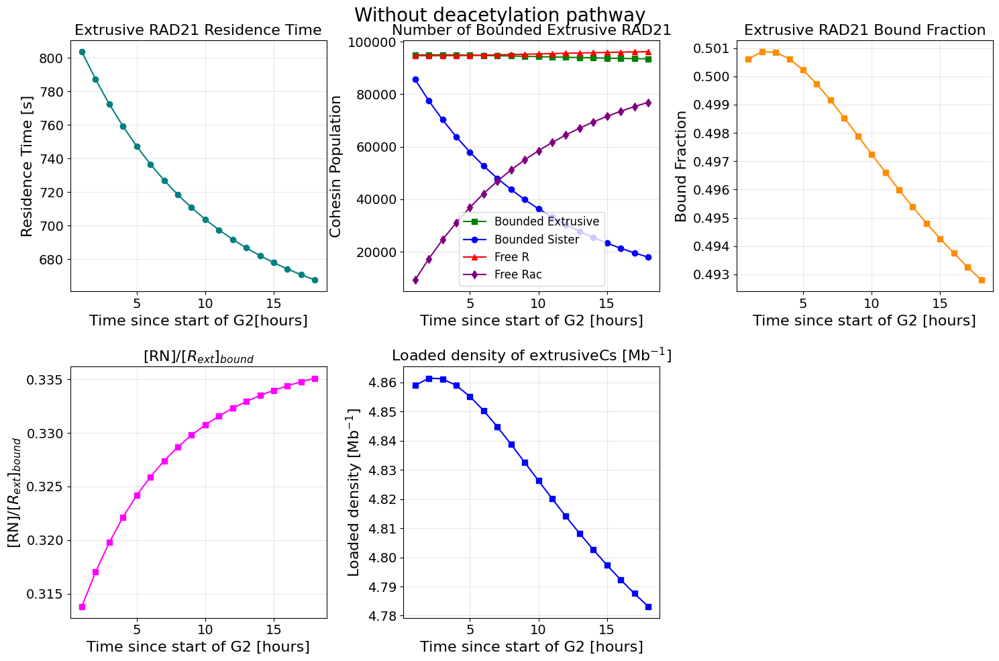

In [24]:
hours = []
ext_R_residence_times = []
ext_R_bound_fractions = []
processity_ratios = []
bounded_ext = []
bounded_sister = []
R_free_list = []
Rac_free_list = [] 
loaded_density = []

for h in range(1, 19):  # 1h to 18h inclusive
    index = 3600 * h - 1 if h > 0 else 0
    
    bounded_ext_R = df_WT['R'][index] + df_WT['RP'][index] + df_WT['RN'][index] + df_WT['RPW'][index]
    
    bounded_sister_R = df_WT['Rac'][index] + df_WT['RacN'][index] + df_WT['RacP'][index] + df_WT['RacPW'][index] + df_WT['RacPS'][index]

    Rac_free = df_WT['Rac_free'][index]

    R_free = df_WT['R_free'][index]

    B_W_ext = df_WT['RPW'][index]
    
    extrusive_lifetime = extrusive_RAD21_bound_time(
        Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'],
        B_W_ext = B_W_ext,
        B_R_ext = bounded_ext_R
    )
    
    bound_fraction = bounded_ext_R / (bounded_ext_R + df_WT['R_free'][index])

    processity = df_WT['RN'][index]/bounded_ext_R
    
    # Save values for plotting
    hours.append(h)
    bounded_ext.append(bounded_ext_R)
    bounded_sister.append(bounded_sister_R)
    R_free_list.append(R_free)
    Rac_free_list.append(Rac_free)
    ext_R_residence_times.append(extrusive_lifetime)
    ext_R_bound_fractions.append(bound_fraction)
    loaded_density.append(bounded_ext_R/19.539/1000)
    processity_ratios.append(processity)

    print(f"{h}h -- {extrusive_lifetime} -- {bound_fraction} -- {processity}")

# Plotting
# Create figure with better spacing
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Without deacetylation pathway', fontsize=20)

# Plot residence time
axes[0, 0].plot(hours, ext_R_residence_times, marker='o', color='teal')
axes[0, 0].set_title("Extrusive RAD21 Residence Time", fontsize=16)
axes[0, 0].set_xlabel("Time since start of G2[hours]", fontsize=16)
axes[0, 0].set_ylabel("Residence Time [s]", fontsize=16)
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].tick_params(labelsize=14)

# Plot bound fraction
axes[0, 1].plot(hours, bounded_ext, marker='s', color='green', label='Bounded Extrusive')
axes[0, 1].plot(hours, bounded_sister, marker='o', color='blue', label='Bounded Sister')
axes[0, 1].plot(hours, R_free_list, marker='^', color='red', label='Free R')
axes[0, 1].plot(hours, Rac_free_list, marker='d', color='purple', label='Free Rac')
axes[0, 1].set_title("Number of Bounded Extrusive RAD21", fontsize=16)
axes[0, 1].set_xlabel("Time since start of G2 [hours]", fontsize=16)
axes[0, 1].set_ylabel("Cohesin Population", fontsize=16)
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].tick_params(labelsize=14)
axes[0, 1].legend(fontsize=12)

# Plot bound fraction
axes[0, 2].plot(hours, ext_R_bound_fractions, marker='s', color='darkorange')
axes[0, 2].set_title("Extrusive RAD21 Bound Fraction", fontsize=16)
axes[0, 2].set_xlabel("Time since start of G2 [hours]", fontsize=16)
axes[0, 2].set_ylabel("Bound Fraction", fontsize=16)
axes[0, 2].grid(True, alpha=0.3)
axes[0, 2].tick_params(labelsize=14)

axes[1, 0].plot(hours, processity_ratios, marker='s', color='magenta')
axes[1, 0].set_title("[RN]/[$R_{ext}]_{bound}$", fontsize=16)
axes[1, 0].set_xlabel("Time since start of G2 [hours]", fontsize=16)
axes[1, 0].set_ylabel("[RN]/[$R_{ext}]_{bound}$", fontsize=16)
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].tick_params(labelsize=14)

axes[1, 1].plot(hours, loaded_density, marker='s', color='blue')
axes[1, 1].set_title("Loaded density of extrusiveCs [Mb$^{-1}$]", fontsize=16)
axes[1, 1].set_xlabel("Time since start of G2 [hours]", fontsize=16)
axes[1, 1].set_ylabel("Loaded density [Mb$^{-1}$]", fontsize=16)
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].tick_params(labelsize=14)

# Remove the empty subplot
axes[1, 2].remove()

# Adjust spacing between subplots
plt.tight_layout()
plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.3)
plt.show()

In [25]:
def Wapl_bound_time_sister(K_RacPW_RacP, K_RacPW_Rac_free):
    # K_RacPW_RacP + K_RacPW_Rac_free - 1/tau_W,        # Wapl unbinding  
    return 1/(K_RacPW_RacP + K_RacPW_Rac_free)

def Wapl_bound_fraction_sister(tau_W_sister, K_RacP_RacPW, RacP):
    # F_W/(tau_W * (1-F_W)) - K_RacP_RacPW*(F_P*N_P - F_S*N_S - F_W*N_W), # Wapl binding 
    temp = tau_W_sister*K_RacP_RacPW*RacP
    return temp/(1+temp)

tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], 
            K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
F_W_sister = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, 
            K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], 
            RacP=r_ext_coh.RacP_conc)
print(tau_W_sister)
print(F_W_sister)

45.0000000000000
0.0289578324107644


In [26]:
def Wapl_bound_time_extrusive(Kext_RPW_RP, Kext_RPW_R_free):
    # Kext_RPW_RP + Kext_RPW_R_free - 1 / tau_W_ext, # WAPL unbinding kinetics
    return 1/(Kext_RPW_RP + Kext_RPW_R_free)

def Wapl_bound_fraction_extrusive(tau_W_ext, Kext_RP_RPW, RP):
    # Kext_RP_RPW * (N_P_ext * F_P_ext - N_W_ext* F_W_ext)  - F_W_ext / tau_W_ext / (1-F_W_ext), # WAPL binding equilibrium
    temp = tau_W_ext*Kext_RP_RPW*RP
    return temp/(1+temp)

tau_W_ext = Wapl_bound_time_extrusive(Kext_RPW_RP = paras_dict_ext_coh['Kext_RPW_RP'], 
            Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'])
F_W_ext = Wapl_bound_fraction_extrusive(tau_W_ext = tau_W_ext, 
            Kext_RP_RPW = paras_dict_ext_coh['Kext_RP_RPW'], 
            RP=r_ext_coh.RP_conc)

print(tau_W_ext)
print(F_W_ext)

45.0000000000000
0.271998951648685


In [27]:
def Sororin_bound_time(K_RacPS_RacP):
    # K_RacPS_RacP - 1/tau_S,   # Sororin unbinding
    return 1/(K_RacPS_RacP)

def Sororin_bound_fraction(tau_S, K_RacP_RacPS, RacP):
    # F_S/(tau_S * (1-F_S)) - K_RP_RPS * (F_P*N_P - F_S*N_S - F_W*N_W), # Sororin binding
    temp = tau_S*K_RacP_RacPS*RacP
    return temp/(1+temp)

tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
F_S =  Sororin_bound_fraction(tau_S, K_RacP_RacPS=paras_dict_ext_coh['K_RacP_RacPS'], RacP=r_ext_coh.RacP_conc)
print(tau_S)
print(F_S)

100.000000000000
0.138518066503148


In [28]:
# F_P/(tau_P * (1-F_P)) - K_Rac_RacP * (F_R_sister*N_R - F_P * N_P), # PDS5 binding
# K_RacPW_Rac_free * F_W *N_W + K_RacP_Rac*(F_P*N_P - F_S*N_S - F_W*N_W) - F_P*N_P/tau_P,   # PDS5 unbinding 
def PDS5_bound_time_sister(K_RacPW_Rac_free, K_RacP_Rac, RacP, W_bound_sister, P_bound_sister):
    # K_RacPW_Rac_free * F_W *N_W + K_RacP_Rac*(F_P*N_P - F_S*N_S - F_W*N_W) - F_P*N_P/tau_P,   # PDS5 unbinding  
    return P_bound_sister/(K_RacPW_Rac_free * W_bound_sister +  K_RacP_Rac * RacP)

def PDS5_bound_fraction_sister(tau_P_sister, K_Rac_RacP, Rac):
    # F_P/(tau_P * (1-F_P)) - K_Rac_RacP * (F_R_sister * N_R - F_P * N_P - F_N * N_N),        # PDS5 binding
    temp = tau_P_sister * K_Rac_RacP * Rac
    return temp/(1+temp)

tau_P_sister_6h = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = df_WT['RacP'][time_6h], \
        W_bound_sister = df_WT['RacPW'][time_6h],\
        P_bound_sister = (df_WT['RacP'][time_6h] + df_WT['RacPW'][time_6h] + df_WT['RacPS'][time_6h]))

F_P_sister_6h = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister_6h, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = df_WT['Rac'][time_6h] )

tau_P_sister_18h = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = r_ext_coh.RacP_conc, \
        W_bound_sister = r_ext_coh.RacPW_conc,\
        P_bound_sister = (r_ext_coh.RacP_conc + r_ext_coh.RacPW_conc + r_ext_coh.RacPS_conc))

F_P_sister_18h = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister_18h, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = r_ext_coh.Rac_conc)

print(tau_P_sister_6h, tau_P_sister_18h)
print(F_P_sister_6h, F_P_sister_18h )

102.252236405932 116.145794818705
0.161747560585275 0.0846566301232822


In [29]:
def PDS5_bound_time_extrusive(Kext_RPW_R_free, Kext_RP_R, RP, W_bound_ext, P_bound_ext):
    # Kext_RP_R * (N_P_ext * F_P_ext - N_W_ext * F_W_ext) + Kext_RPW_R_free * N_W_ext * F_W_ext  - N_P_ext * F_P_ext/tau_P_ext, # PDS5 unbinding kinetics
    return P_bound_ext/(Kext_RPW_R_free * W_bound_ext +  Kext_RP_R * RP)

def PDS5_bound_fraction_extrusive(tau_P_extrusive, K_R_RP, R):
    #  Kext_R_RP * (N_R_ext * F_R_ext - N_N_ext * F_N_ext - N_P_ext * F_P_ext)  - F_P_ext / tau_P_ext /(1-F_P_ext), # PDS5 binding equilibrium,
    temp = tau_P_extrusive * K_R_RP * R
    return temp/(1+temp)

tau_P_extrusive_6h = PDS5_bound_time_extrusive(Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'], \
        Kext_RP_R = paras_dict_ext_coh['Kext_RP_R'], \
        RP = df_WT['RP'][time_6h], \
        W_bound_ext = df_WT['RPW'][time_6h],\
        P_bound_ext = (df_WT['RP'][time_6h] + df_WT['RPW'][time_6h]))

F_P_sister_6h = PDS5_bound_fraction_extrusive(tau_P_extrusive = tau_P_extrusive_6h, \
        K_R_RP = paras_dict_ext_coh['Kext_R_RP'], \
        R = df_WT['R'][time_6h])

tau_P_extrusive = PDS5_bound_time_extrusive(Kext_RPW_R_free = paras_dict_ext_coh['Kext_RPW_R_free'], \
        Kext_RP_R = paras_dict_ext_coh['Kext_RP_R'], \
        RP = r_ext_coh.RP_conc, \
        W_bound_ext = r_ext_coh.RPW_conc,\
        P_bound_ext = (r_ext_coh.RP_conc + r_ext_coh.RPW_conc))

F_P_extrusive = PDS5_bound_fraction_extrusive(tau_P_extrusive = tau_P_extrusive, \
        K_R_RP = paras_dict_ext_coh['Kext_R_RP'], \
        R = r_ext_coh.R_conc)

print(tau_P_extrusive_6h, tau_P_extrusive)
print(F_P_sister_6h, F_P_extrusive)

73.8073411596137 74.2632402907416
0.150477810685828 0.145066198320329


### Depletion of Sororin

N_S Value: 0
Cohesin Bound Time: 15192.7345800125
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.00764520095389882
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0398821674885338
PDS5 Time: 19.3642502658064, PDS5 Bound Fraction: 0.00366986440149788


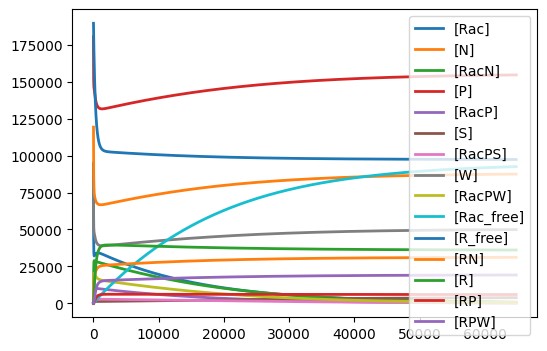

N_S Value: 3988.5
Cohesin Bound Time: 16596.8563375029
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.000186026218549913
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.00100219394869764
PDS5 Time: 25.0801308212164, PDS5 Bound Fraction: 0.000114819897462365
N_S Value: 7977.0
Cohesin Bound Time: 18059.7198319078
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0106843582503088
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0550257327216638
PDS5 Time: 29.9946769319642, PDS5 Bound Fraction: 0.00796304311313299
N_S Value: 15954.0
Cohesin Bound Time: 20861.2665965519
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0136061556231131
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0692248682648331
PDS5 Time: 40.2938506492258, PDS5 Bound Fraction: 0.0136540192748353
N_S Value: 39885.0
Cohesin Bound Time: 28949.4157470507
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0210675161842803
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.103971

In [30]:
parameter_dict_string_keys = {str(key): value for key, value in paras_dict_ext_coh.items()}
# Define ranges for K_SX (from S to X) and N_X
# N_S_values = np.logspace(-10, 0, 10)
N_S_values = [i * paras_dict_ext_coh['N_S'] for i in [0, 0.05, 0.1, 0.2, 0.5, 1]]
# Initialize an empty matrix to store bound_time values
bound_time_matrix = np.zeros(len(N_S_values))

for i, N_S_val in enumerate(N_S_values):
    # simulated WT five-state model
    parameter_dict_string_keys.update({'S_init':  N_S_val})
    model = build_model_ext_coh(model_ext_coh, parameter_dict_string_keys)
    # Load the model
    r = te.loada(model)
    # Simulate the model
    if i==1:
        r = te.loada(model)
        Model_dSororin = r.simulate(0, 3600*18, 3600*18)
        r.plot()
    
    r.simulate(0, 3600*18, 3600*18)
    
    sister_RAD21_time = sister_RAD21_bound_time(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = r.RacPW_conc, \
        B_R_sister = r.RacPS_conc + r.RacPW_conc + r.RacP_conc + r.Rac_conc + r.RacN_conc)

    tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], \
                K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
    
    fraction_W = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, \
                K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], RacP = r.RacP_conc)

    tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
    fraction_S =  Sororin_bound_fraction(tau_S, \
                 K_RacP_RacPS = paras_dict_ext_coh['K_RacP_RacPS'], RacP=r.RacP_conc)

    tau_P_sister = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = r.RacP_conc, \
        W_bound_sister = r.RacPW_conc,\
        P_bound_sister = (r.RacP_conc + r.RacPW_conc + r.RacPS_conc))

    fraction_P = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = r.Rac_conc)
    
    print("N_S Value: {}".format(N_S_val))
    print("Cohesin Bound Time: {}".format(sister_RAD21_time))
    print("Wapl Time: {}, Wapl Bound Fraction: {}".format(tau_W_sister, fraction_W))
    print("Sororin Time: {}, Sororin Bound Fraction: {}".format(tau_S, fraction_S))
    print("PDS5 Time: {}, PDS5 Bound Fraction: {}".format(tau_P_sister, fraction_P))

### depletion of Wapl

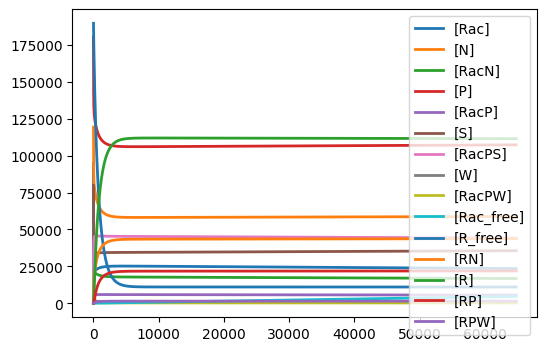

N_W Value: 2714.22426
Cohesin Bound Time: 1337409.42546482
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.177765322049904
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.538253666147419
PDS5 Time: 58.6097117763460, PDS5 Bound Fraction: 0.307925835332684
N_W Value: 5428.44852
Cohesin Bound Time: 643811.220441694
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.175951790709843
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.535156107577862
PDS5 Time: 59.2487432078696, PDS5 Bound Fraction: 0.306583546114824
N_W Value: 10856.89704
Cohesin Bound Time: 308606.457976047
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.154104478273564
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.495527819578716
PDS5 Time: 64.3699934336984, PDS5 Bound Fraction: 0.283757361621396
N_W Value: 16285.345559999998
Cohesin Bound Time: 199106.966046050
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.133460643434103
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0

In [36]:
parameter_dict_string_keys = {str(key): value for key, value in paras_dict_ext_coh.items()}
# Define ranges for K_SX (from S to X) and N_X
# N_S_values = np.logspace(-10, 0, 10)
N_W_values = [i * paras_dict_ext_coh['N_W'] for i in [0.05, 0.1, 0.2, 0.3, 1]]
# Initialize an empty matrix to store bound_time values
bound_time_matrix = np.zeros(len(N_W_values))

for i, N_W_val in enumerate(N_W_values):
    # simulated WT five-state model
    parameter_dict_string_keys["W_init"] = N_W_val
    model = build_model_ext_coh(model_ext_coh, parameter_dict_string_keys)
    # Load the model
    r = te.loada(model)
    # Simulate the model
    if i==0:
        r = te.loada(model)
        Model_dWapl = r.simulate(0, 3600*18, 3600*18)
        r.plot()
    
    r.simulate(0, 3600*18, 3600*18)
    
    sister_RAD21_time = sister_RAD21_bound_time(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = r.RacPW_conc, \
        B_R_sister = r.RacPS_conc + r.RacPW_conc + r.RacP_conc + r.Rac_conc + r.RacN_conc)

    tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], \
            K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
    
    fraction_W = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, \
            K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], RacP = r.RacP_conc)

    tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
    fraction_S =  Sororin_bound_fraction(tau_S, \
                 K_RacP_RacPS = paras_dict_ext_coh['K_RacP_RacPS'], RacP=r.RacP_conc)

    tau_P_sister = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = r.RacP_conc, \
        W_bound_sister = r.RacPW_conc,\
        P_bound_sister = (r.RacP_conc + r.RacPW_conc + r.RacPS_conc))

    fraction_P = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = r.Rac_conc)
    
    print("N_W Value: {}".format(N_W_val))
    print("Cohesin Bound Time: {}".format(sister_RAD21_time))
    print("Wapl Time: {}, Wapl Bound Fraction: {}".format(tau_W_sister, fraction_W))
    print("Sororin Time: {}, Sororin Bound Fraction: {}".format(tau_S, fraction_S))
    print("PDS5 Time: {}, PDS5 Bound Fraction: {}".format(tau_P_sister, fraction_P))

In [32]:
paras_dict_coh[N_R]

In [33]:
import pandas as pd
columns = ['time', 'Rac', 'N', 'RacN', 'P', 'RacP', 'S', 'RacPS', 'W', 'RacPW', 
           'Rac_free', 'R_free', 'RN', 'R', 'RP', 'RPW']

df_dWapl = pd.DataFrame(Model_dWapl, columns=columns)

for h in range(19):  # 0h to 18h inclusive
    index = 3600 * h - 1 if h > 0 else 0
    sister_ratio = (
        df_dWapl['Rac'][index] + df_dWapl['RacN'][index] + df_dWapl['RacP'][index] + df_dWapl['RacPW'][index] 
        + df_dWapl['RacPS'][index]) / (paras_dict_coh[N_R]*0.5)
    sister_ratio_4f = "{:.4f}".format(sister_ratio)
    sister_value = int(7765*sister_ratio)
    ext_ratio = (df_dWapl['R'][index] + df_dWapl['RN'][index] + df_dWapl['RP'][index] + df_dWapl['RPW'][index]) / (paras_dict_coh[N_R]*0.5)
    ext_ratio_4f =  "{:.4f}".format(ext_ratio)
    ext_value = int(7765 * ext_ratio)
    print(f"{h}h -- {sister_value} -- {sister_ratio_4f} -- {ext_value} -- {ext_ratio_4f}")

0h -- 7764 -- 1.0000 -- 0 -- 0.0000
1h -- 7739 -- 0.9967 -- 14380 -- 1.8520
2h -- 7718 -- 0.9940 -- 14620 -- 1.8828
3h -- 7696 -- 0.9912 -- 14625 -- 1.8836
4h -- 7675 -- 0.9885 -- 14626 -- 1.8836
5h -- 7654 -- 0.9858 -- 14626 -- 1.8836
6h -- 7633 -- 0.9831 -- 14626 -- 1.8836
7h -- 7612 -- 0.9804 -- 14626 -- 1.8837
8h -- 7591 -- 0.9777 -- 14626 -- 1.8837
9h -- 7570 -- 0.9750 -- 14626 -- 1.8837
10h -- 7550 -- 0.9723 -- 14627 -- 1.8837
11h -- 7529 -- 0.9697 -- 14627 -- 1.8837
12h -- 7508 -- 0.9670 -- 14627 -- 1.8838
13h -- 7488 -- 0.9644 -- 14627 -- 1.8838
14h -- 7468 -- 0.9618 -- 14627 -- 1.8838
15h -- 7447 -- 0.9591 -- 14627 -- 1.8838
16h -- 7427 -- 0.9565 -- 14628 -- 1.8838
17h -- 7407 -- 0.9539 -- 14628 -- 1.8839
18h -- 7386 -- 0.9513 -- 14628 -- 1.8839


### depletion of Nipbl

N_N Value: 0.0
Cohesin Bound Time: 28012.5546835298
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0131306226145931
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0669373820287004
PDS5 Time: 129.148669452657, PDS5 Bound Fraction: 0.0363352329059446


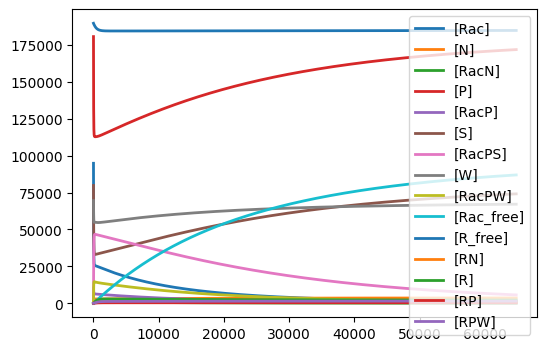

N_N Value: 4495.52544
Cohesin Bound Time: 29624.4299813836
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.00147726747079346
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.00791376027223889
PDS5 Time: 135.621856353072, PDS5 Bound Fraction: 0.00428562948836468
N_N Value: 8991.05088
Cohesin Bound Time: 29321.6680262383
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0147198609713832
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0745470734511846
PDS5 Time: 127.529018967915, PDS5 Bound Fraction: 0.0411008603650616
N_N Value: 17982.10176
Cohesin Bound Time: 30599.0390223170
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0162848704060609
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0819438710314739
PDS5 Time: 126.029166778528, PDS5 Bound Fraction: 0.0458286456430349
N_N Value: 26973.152639999997
Cohesin Bound Time: 31836.9231016454
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0178029058614701
Sororin Time: 100.000000000000, Sororin Boun

In [35]:
parameter_dict_string_keys = {str(key): value for key, value in paras_dict_ext_coh.items()}
# Define ranges for K_SX (from S to X) and N_X
# N_S_values = np.logspace(-10, 0, 10)
N_N_values = [i * paras_dict_ext_coh['N_N'] for i in [0, 0.05, 0.1, 0.2, 0.3, 1]]
# Initialize an empty matrix to store bound_time values
bound_time_matrix = np.zeros(len(N_N_values))

for i, N_N_val in enumerate(N_N_values):
    # simulated WT five-state model
    parameter_dict_string_keys["N_init"] = N_N_val
    model = build_model_ext_coh(model_ext_coh, parameter_dict_string_keys)
    # Load the model
    r = te.loada(model)
    # Simulate the model
    if i==1:
        r = te.loada(model)
        Model_dNipbl = r.simulate(0, 3600*18, 3600*18)
        r.plot()
    
    r.simulate(0, 3600*18, 3600*18)
    
    sister_RAD21_time = sister_RAD21_bound_time(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = r.RacPW_conc, \
        B_R_sister = r.RacPS_conc + r.RacPW_conc + r.RacP_conc + r.Rac_conc + r.RacN_conc)

    tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], \
            K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
    
    fraction_W = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, \
            K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], RacP = r.RacP_conc)

    tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
    fraction_S =  Sororin_bound_fraction(tau_S, \
                 K_RacP_RacPS = paras_dict_ext_coh['K_RacP_RacPS'], RacP=r.RacP_conc)

    tau_P_sister = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = r.RacP_conc, \
        W_bound_sister = r.RacPW_conc,\
        P_bound_sister = (r.RacP_conc + r.RacPW_conc + r.RacPS_conc))

    fraction_P = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = r.Rac_conc)
    
    print("N_N Value: {}".format(N_N_val))
    print("Cohesin Bound Time: {}".format(sister_RAD21_time))
    print("Wapl Time: {}, Wapl Bound Fraction: {}".format(tau_W_sister, fraction_W))
    print("Sororin Time: {}, Sororin Bound Fraction: {}".format(tau_S, fraction_S))
    print("PDS5 Time: {}, PDS5 Bound Fraction: {}".format(tau_P_sister, fraction_P))

### depletion of PDS5

N_P Value: 0.0
Cohesin Bound Time: zoo
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0
PDS5 Time: nan, PDS5 Bound Fraction: nan


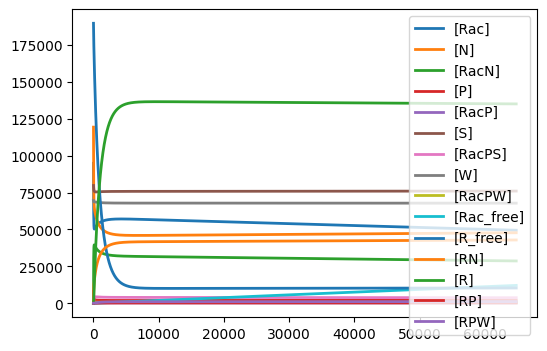

N_P Value: 8007.566025
Cohesin Bound Time: 426906.546961421
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.00844528480347984
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0439066400385046
PDS5 Time: 131.155490562835, PDS5 Bound Fraction: 0.656450900326042
N_P Value: 16015.13205
Cohesin Bound Time: 219416.258579181
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0168018406982330
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.0843664525276221
PDS5 Time: 126.199174319341, PDS5 Bound Fraction: 0.631676381198849
N_P Value: 32030.2641
Cohesin Bound Time: 106732.986569632
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0272341344075857
Sororin Time: 100.000000000000, Sororin Bound Fraction: 0.131153686518892
PDS5 Time: 120.140018541534, PDS5 Bound Fraction: 0.501891784407929
N_P Value: 48045.39615
Cohesin Bound Time: 74208.0961640888
Wapl Time: 45.0000000000000, Wapl Bound Fraction: 0.0318307288230453
Sororin Time: 100.000000000000, Sororin Bound Fraction: 

In [37]:
parameter_dict_string_keys = {str(key): value for key, value in paras_dict_ext_coh.items()}
# Define ranges for K_SX (from S to X) and N_X
# N_S_values = np.logspace(-10, 0, 10)
N_P_values = [i * paras_dict_ext_coh['N_P'] for i in [0, 0.05, 0.1, 0.2, 0.3, 1]]
# Initialize an empty matrix to store bound_time values
bound_time_matrix = np.zeros(len(N_P_values))

for i, N_P_val in enumerate(N_P_values):
    # simulated WT five-state model
    parameter_dict_string_keys["P_init"] = N_P_val
    model = build_model_ext_coh(model_ext_coh, parameter_dict_string_keys)
    # Load the model
    r = te.loada(model)
    # Simulate the model
    if i==1:
        r = te.loada(model)
        Model_dPDS5 = r.simulate(0, 3600*18, 3600*18)
        r.plot()
    
    r.simulate(0, 3600*18, 3600*18)
    
    sister_RAD21_time = sister_RAD21_bound_time(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        B_W_sister = r.RacPW_conc, \
        B_R_sister = r.RacPS_conc + r.RacPW_conc + r.RacP_conc + r.Rac_conc + r.RacN_conc)

    tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], \
            K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
    
    fraction_W = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, \
            K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], RacP = r.RacP_conc)

    tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
    fraction_S =  Sororin_bound_fraction(tau_S, \
                 K_RacP_RacPS = paras_dict_ext_coh['K_RacP_RacPS'], RacP=r.RacP_conc)

    tau_P_sister = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
        K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
        RacP = r.RacP_conc, \
        W_bound_sister = r.RacPW_conc,\
        P_bound_sister = (r.RacP_conc + r.RacPW_conc + r.RacPS_conc))

    fraction_P = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister, \
        K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
        Rac = r.Rac_conc)
    
    print("N_P Value: {}".format(N_P_val))
    print("Cohesin Bound Time: {}".format(sister_RAD21_time))
    print("Wapl Time: {}, Wapl Bound Fraction: {}".format(tau_W_sister, fraction_W))
    print("Sororin Time: {}, Sororin Bound Fraction: {}".format(tau_S, fraction_S))
    print("PDS5 Time: {}, PDS5 Bound Fraction: {}".format(tau_P_sister, fraction_P))

### dWapl, dSororin

In [38]:
parameter_dict_string_keys = {str(key): value for key, value in paras_dict_ext_coh.items()}
print(parameter_dict_string_keys)

# Define ranges for K_SX (from S to X) and N_X
N_S_values = [0.05*paras_dict_ext_coh['N_S']]
N_W_values = [0.05*paras_dict_ext_coh['N_W']]

# Initialize an empty matrix to store bound_time values
bound_time_matrix = np.zeros((len(N_S_values), len(N_W_values)))

for i, N_S_val in enumerate(N_S_values):
    for j, N_W_val in enumerate(N_W_values): 
        # simulated WT five-state mode
        parameter_dict_string_keys["S_init"] = N_S_val
        parameter_dict_string_keys["W_init"] = N_W_val
        parameter_dict_string_keys.update({'S_init':  N_S_val})
        parameter_dict_string_keys.update({'W_init':  N_W_val})
        model = build_model_ext_coh(model_ext_coh, parameter_dict_string_keys)
        print(model)
        # Load the model
        r = te.loada(model)
        # Load the model
        # if i==0:
        #    r = te.loada(model)
        #     Model_dWdS = r.simulate(0, 3600*18, 100000)
        # r = te.loada(model)
        Model_dWdS = r.simulate(0, 3600*18, 3600*18)
        r.simulate(0, 3600*6, 100000)

        sister_RAD21_time = sister_RAD21_bound_time(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
             B_W_sister = r.RacPW_conc, \
             B_R_sister = r.RacPS_conc + r.RacPW_conc + r.RacP_conc + r.Rac_conc + r.RN_conc)

        tau_W_sister = Wapl_bound_time_sister(K_RacPW_RacP = paras_dict_ext_coh['K_RacPW_RacP'], \
                K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'])
    
        fraction_W = Wapl_bound_fraction_sister(tau_W_sister = tau_W_sister, \
                K_RacP_RacPW = paras_dict_ext_coh['K_RacP_RacPW'], RacP = r.RacP_conc)

        tau_S = Sororin_bound_time(K_RacPS_RacP = paras_dict_ext_coh['K_RacPS_RacP'])
        fraction_S =  Sororin_bound_fraction(tau_S, \
                 K_RacP_RacPS = paras_dict_ext_coh['K_RacP_RacPS'], RacP=r.RacP_conc)

        tau_P_sister = PDS5_bound_time_sister(K_RacPW_Rac_free = paras_dict_ext_coh['K_RacPW_Rac_free'], \
                K_RacP_Rac = paras_dict_ext_coh['K_RacP_Rac'], \
                RacP = r.RacP_conc, \
                W_bound_sister = r.RacPW_conc,\
                P_bound_sister = (r.RacP_conc + r.RacPW_conc + r.RacPS_conc))

        fraction_P = PDS5_bound_fraction_sister(tau_P_sister = tau_P_sister, \
                K_Rac_RacP = paras_dict_ext_coh['K_Rac_RacP'], \
                Rac = r.Rac_conc)
    
        print("Cohesin Bound Time: {}".format(sister_RAD21_time))
        print("Wapl Time: {}, Wapl Bound Fraction: {}".format(tau_W_sister, fraction_W))
        print("Sororin Time: {}, Sororin Bound Fraction: {}".format(tau_S, fraction_S))
        print("PDS5 Time: {}, PDS5 Bound Fraction: {}".format(tau_P_sister, fraction_P))

{'tau_S': 100.0, 'F_S': 0.52, 'N_S': 79770, 'tau_W': 45.0, 'F_W': 0.16730719959005894, 'N_W': 54284.485199999996, 'tau_P': 72, 'F_P': 0.3458892522837487, 'N_P': 160151.3205, 'tau_N': 72.0, 'F_N': 0.20382165605095542, 'N_N': 89910.5088, 'tau_R': 36000, 'F_R_sister': 0.5, 'N_R': 189646.66666666666, 'K_RacPW_RacP': 0.0219322059515254, 'K_RacP_Rac': 0.158677596516148, 'K_RacPW_Rac_free': 0.000290016270696779, 'K_Rac_RacN': 1.68485754442323e-7, 'K_RacN_Rac': 0.0138888888888889, 'K_RacP_RacPW': 9.24032418587105e-7, 'K_RacP_RacPS': 2.24198141378093e-6, 'K_RacPS_RacP': 0.0100000000000000, 'K_Rac_RacP': 3.48023847571798e-7, 'tau_N_ext': 72.0, 'F_N_ext': 0.29111531190926276, 'N_N_ext': 100982.2912, 'tau_W_ext': 45.0, 'F_W_ext': 0.2523579480101219, 'N_W_ext': 60459.8148, 'tau_P_ext': 72, 'F_P_ext': 0.16342131833261214, 'N_P_ext': 125220.37950000001, 'tau_R_ext': 822.0, 'F_R_ext': 0.5, 'N_R_ext': 189646.66666666666, 'Kext_RN_R': 0.0138888888888889, 'Kext_R_free_RN': 1.69944598876500e-8, 'Kext_R_RN

In [39]:
import pandas as pd
columns = ['time', 'Rac', 'N', 'RacN', 'P', 'RacP', 'S', 'RacPS', 'W', 'RacPW', 
           'Rac_free', 'R_free', 'RN', 'R', 'RP', 'RPW']

df_dWdS = pd.DataFrame(Model_dWdS, columns=columns)

for h in range(19):  # 0h to 18h inclusive
    index = 3600 * h - 1 if h > 0 else 0
    sister_ratio = (
        df_dWdS['Rac'][index] + df_dWdS['RacN'][index] + df_dWdS['RacP'][index] + df_dWdS['RacPW'][index] 
        + df_dWdS['RacPS'][index]) / (paras_dict_coh[N_R]*0.5)
    sister_ratio_4f = "{:.4f}".format(sister_ratio)
    sister_value = int(7765*sister_ratio)
    ext_ratio = (df_dWdS['R'][index] + df_dWdS['RN'][index] + df_dWdS['RP'][index] + df_dWdS['RPW'][index]) / (paras_dict_coh[N_R]*0.5)
    ext_ratio_4f =  "{:.4f}".format(ext_ratio)
    ext_value = int(7765 * ext_ratio)
    print(f"{h}h -- {sister_value} -- {sister_ratio_4f} -- {ext_value} -- {ext_ratio_4f}")

0h -- 7764 -- 1.0000 -- 0 -- 0.0000
1h -- 7716 -- 0.9937 -- 14142 -- 1.8213
2h -- 7675 -- 0.9885 -- 14504 -- 1.8680
3h -- 7636 -- 0.9834 -- 14518 -- 1.8697
4h -- 7596 -- 0.9783 -- 14519 -- 1.8698
5h -- 7556 -- 0.9732 -- 14519 -- 1.8699
6h -- 7517 -- 0.9681 -- 14520 -- 1.8700
7h -- 7478 -- 0.9631 -- 14520 -- 1.8701
8h -- 7439 -- 0.9581 -- 14521 -- 1.8701
9h -- 7400 -- 0.9531 -- 14522 -- 1.8702
10h -- 7362 -- 0.9481 -- 14522 -- 1.8703
11h -- 7323 -- 0.9432 -- 14523 -- 1.8704
12h -- 7285 -- 0.9382 -- 14523 -- 1.8704
13h -- 7247 -- 0.9333 -- 14524 -- 1.8705
14h -- 7209 -- 0.9284 -- 14525 -- 1.8706
15h -- 7171 -- 0.9236 -- 14525 -- 1.8707
16h -- 7134 -- 0.9187 -- 14526 -- 1.8707
17h -- 7096 -- 0.9139 -- 14526 -- 1.8708
18h -- 7059 -- 0.9091 -- 14527 -- 1.8709


In [110]:
Model_dPDS5[:,8].shape

In [129]:
Model_ext_coh_WT

       time,   [Rac],     [N],  [RacN],    [P],  [RacP],     [S], [RacPS],     [W], [RacPW], [Rac_free], [R_free],    [RN],     [R],       [RP],       [RPW]
 [[       0, 94823.3,  119308,       0, 180615,       0,   79770,       0,   69542,       0,          0,   189647,       0,       0,          0,           0],
  [ 1.00002, 87774.2,  117127, 1803.16, 175369, 4637.08, 79321.8, 448.235, 69381.4, 160.639,  0.0270439,   189266, 377.944, 2.62103, 0.00904973, 0.000228411],
  [ 2.00003, 82005.5,  115139, 3425.93, 171223, 7330.19, 78252.2, 1517.84, 68998.3, 543.678,   0.190792,   188893, 743.336,  10.296,  0.0678412,  0.00343796],
  [ 3.00005, 77134.8,  113313, 4898.09, 167825, 8831.28, 76855.8, 2914.17, 68497.6, 1044.37,   0.571377,   188527,    1097, 22.7613,   0.215353,   0.0163937],
  [ 4.00006, 72917.1,  111627,  6241.4, 164951, 9606.67, 75312.2, 4457.81, 67942.8, 1599.13,      1.209,   188167, 1439.66, 39.7746,   0.481613,   0.0488747],
  [ 5.00008, 69192.3,  110064, 7472.37, 162457, 

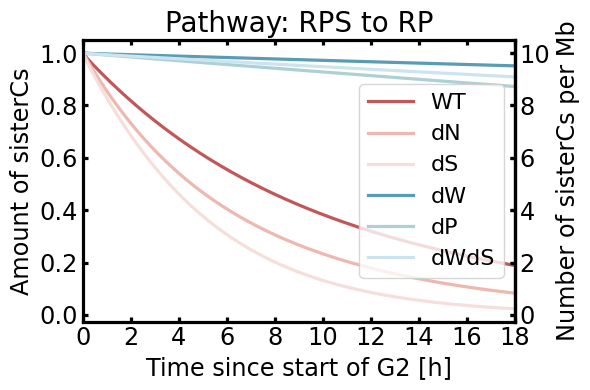

In [44]:
Model_WT_bound_RAD21 =  (Model_ext_coh_WT[:,1] + Model_ext_coh_WT[:,3] + Model_ext_coh_WT[:,5] + Model_ext_coh_WT[:,7] + Model_ext_coh_WT[:,9])/(paras_dict_coh[N_R]*1/2)
Model_dPDS5_bound_RAD21 = (Model_dPDS5[:,1] + Model_dPDS5[:,3] + Model_dPDS5[:,5] + Model_dPDS5[:,7] + Model_dPDS5[:,9])/(paras_dict_coh[N_R]*1/2)
Model_dSororin_bound_RAD21 = (Model_dSororin[:,1] + Model_dSororin[:,3] + Model_dSororin[:,5] + Model_dSororin[:,7] + Model_dSororin[:,9])/(paras_dict_coh[N_R]*1/2)
Model_dWapl_bound_RAD21 = (Model_dWapl[:,1] + Model_dWapl[:,3] + Model_dWapl[:,5] + Model_dWapl[:,7] + Model_dWapl[:,9])/(paras_dict_coh[N_R]*1/2)
Model_dWdS_bound_RAD21 = (Model_dWdS[:,1] + Model_dWdS[:,3] + Model_dWdS[:,5] + Model_dWdS[:,7] + Model_dWdS[:,9])/(paras_dict_coh[N_R]*1/2)
Model_dNipbl_bound_RAD21 = (Model_dNipbl[:,1] + Model_dNipbl[:,3] + Model_dNipbl[:,5] + Model_dNipbl[:,7] + Model_dNipbl[:,9])/(paras_dict_coh[N_R]*1/2)

fig, ax1 = plt.subplots(figsize=(6, 4))
plt.rcParams['svg.fonttype']='none'
time = Model_ext_coh_WT[:, 0]/3600
ax1.plot(time, Model_WT_bound_RAD21, label='WT', color='#C25759', linestyle='solid')
ax1.plot(time, Model_dNipbl_bound_RAD21, label='dN', color ='#EDB8B0', linestyle='solid')
ax1.plot(time, Model_dSororin_bound_RAD21, label='dS', color ='#F5DFDB', linestyle='solid')

ax1.plot(time, Model_dWapl_bound_RAD21, label='dW',color ='#599CB4', linestyle='solid')
ax1.plot(time, Model_dPDS5_bound_RAD21, label='dP', color ='#AECFD4', linestyle='solid')
ax1.plot(time, Model_dWdS_bound_RAD21, label='dWdS', color ='#CCE4EF', linestyle='solid')

ax1.set_xlim([time[0],time[-1]])
ax1.set_xlabel("Time since start of G2 [h]")
ax1.set_ylabel("Amount of sisterCs")
ax1.legend(fontsize=16) 
# Create right y-axis
ax2 = ax1.twinx()
# Set the right y-axis limits to be 10x the left axis
ax2.set_ylim([y * 10 for y in ax1.get_ylim()])
ax2.set_ylabel('Number of sisterCs per Mb')
ax2.set_title('Pathway: RPS to RP', fontsize=20) 
useLargeSize2(plt, ax1, ax2, marker_lines = None, fontsize = 'xx-large', fontproperties=None, LW=2.3)
# plt.savefig("sisterCs_plot.svg", format='svg')